# Deconvolve Postive Controls

For a handful of cell cycling genes, we know the expected gene expression and deconvolution results. So let's look through them to make sure that the fits make sense.


In [6]:
# Preamble, notebook setup and imports

%load_ext autoreload
%autoreload 2
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


In [43]:
from src.config import load_yl_replicate1_rg1_alpha_vst_config, \
    load_yl_replicate2_rg1_alpha_vst_config, \
    load_combined_yl_alpha_vst_gene_expression_config
from src.model import Model

config1 = load_yl_replicate1_rg1_alpha_vst_config()
config2 = load_yl_replicate2_rg1_alpha_vst_config()
config_combined = load_combined_yl_alpha_vst_gene_expression_config()

Deconvolving gene: CLB2
Deconvolving gene: CLN2
Deconvolving gene: RNR1
Deconvolving gene: RNR3
Deconvolving gene: FIG1
Deconvolving gene: FIG2
Deconvolving gene: RAD51


/Users/trung/Research/deconvolution-python/src/model.py:187: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(2, 4, figsize=(16, 9))


Deconvolving gene: RAD53
Deconvolving gene: DSE1
Deconvolving gene: DSE2
Deconvolving gene: DSE3
Deconvolving gene: DSE4


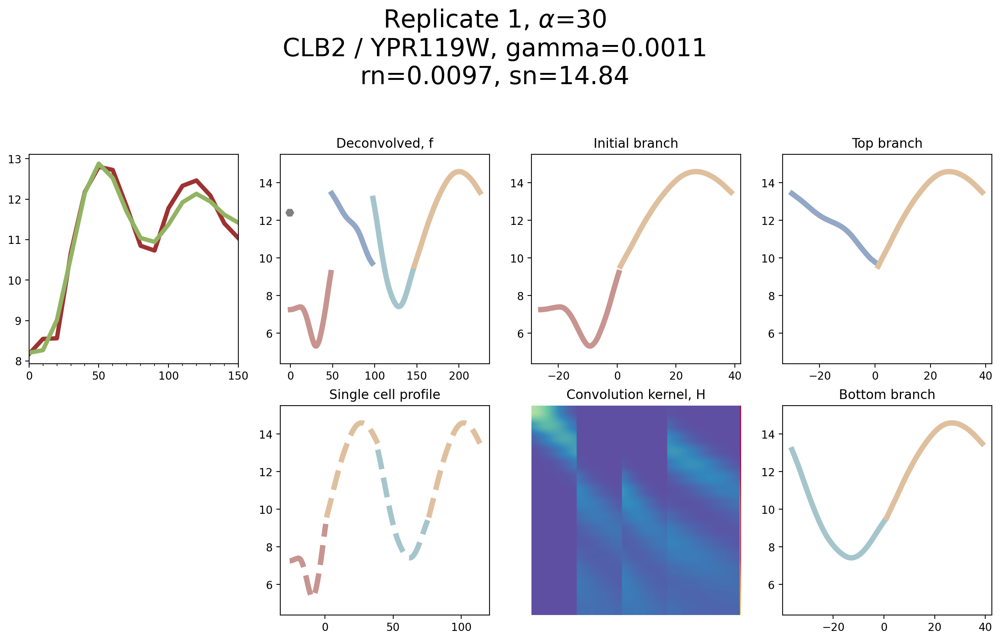

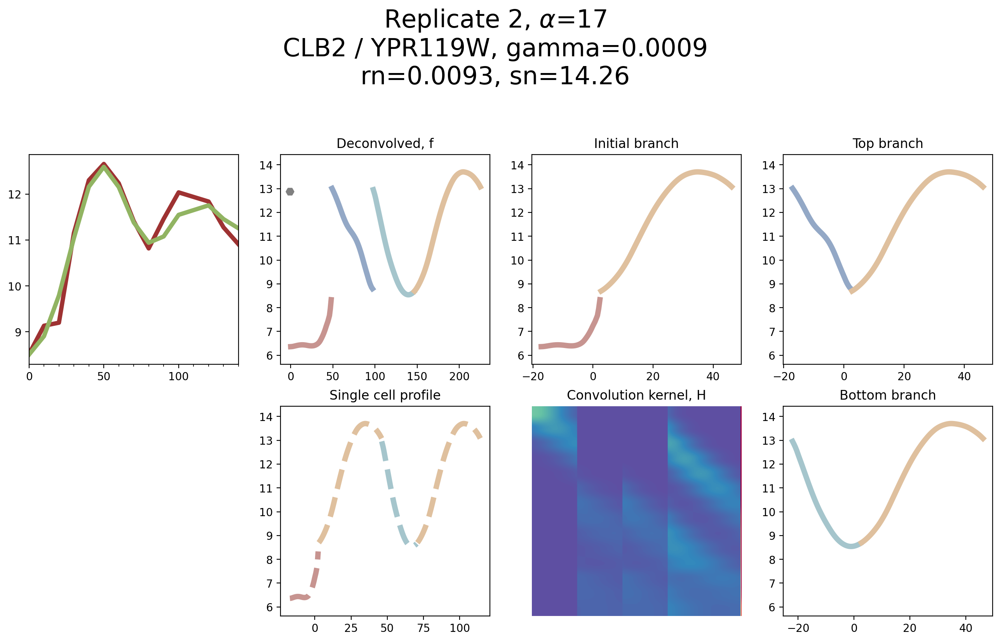

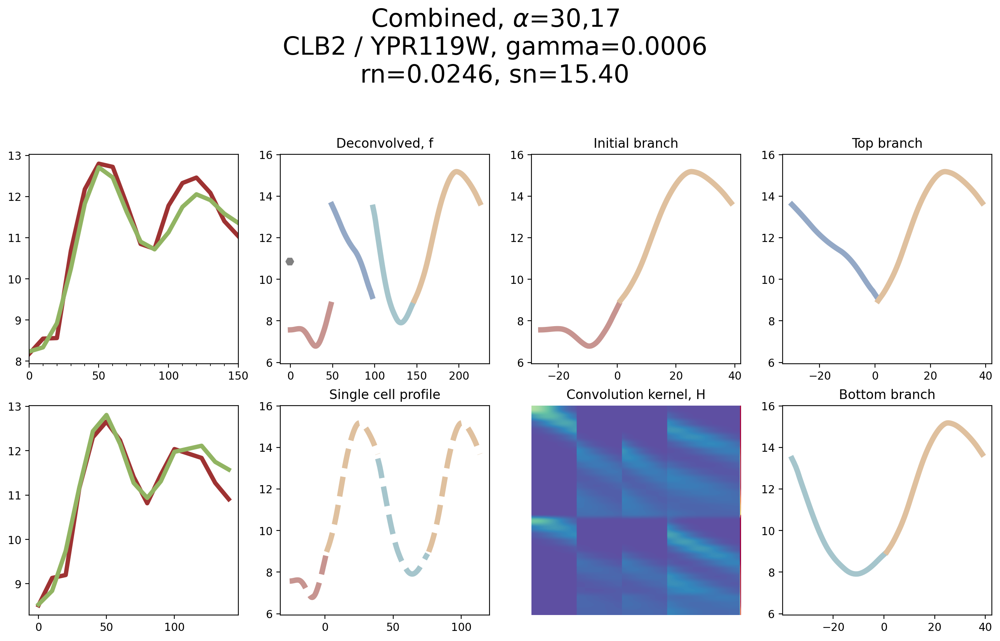

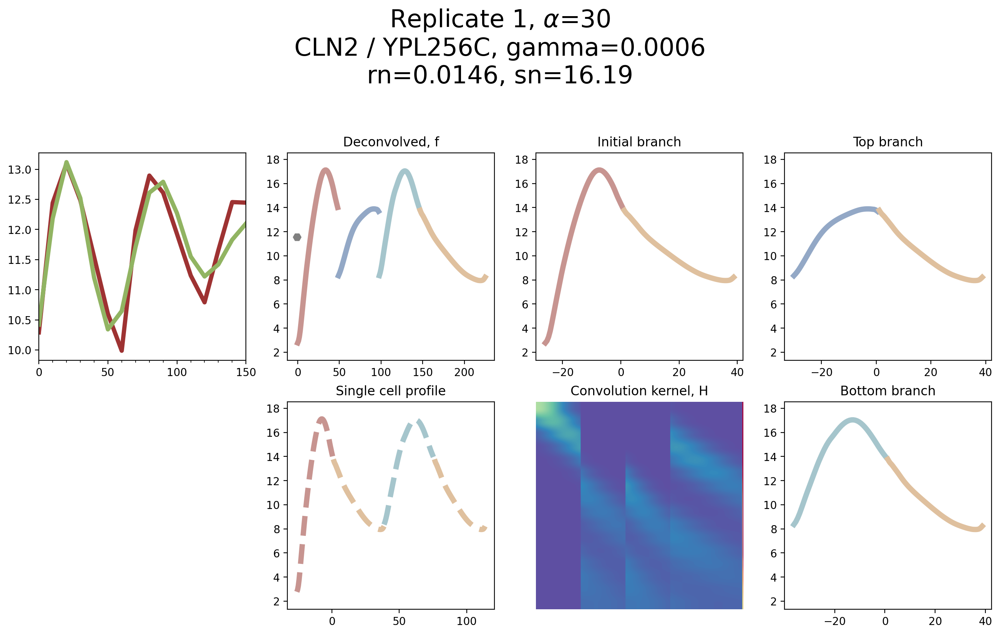

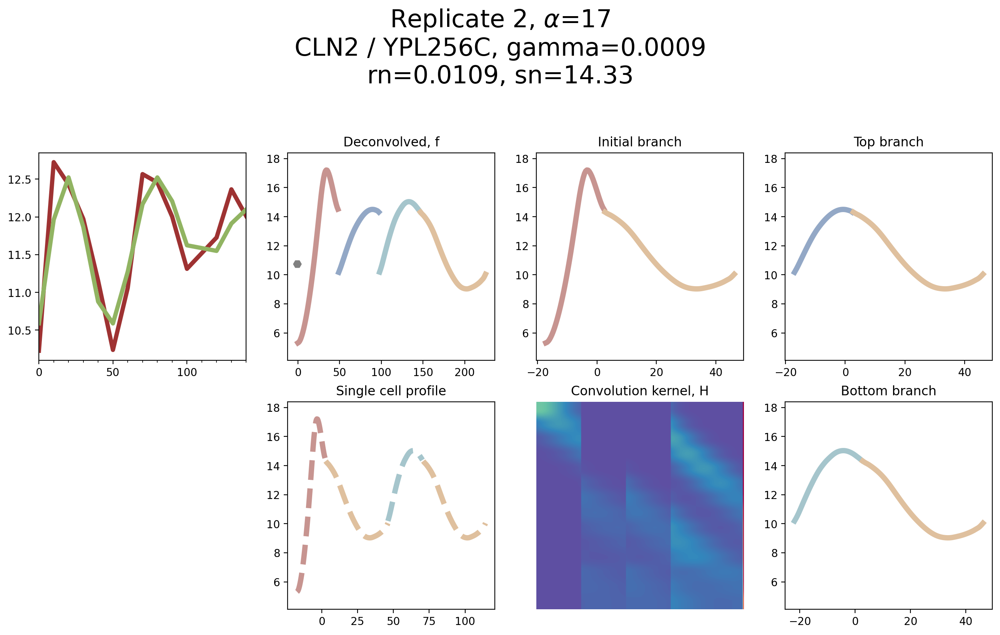

...

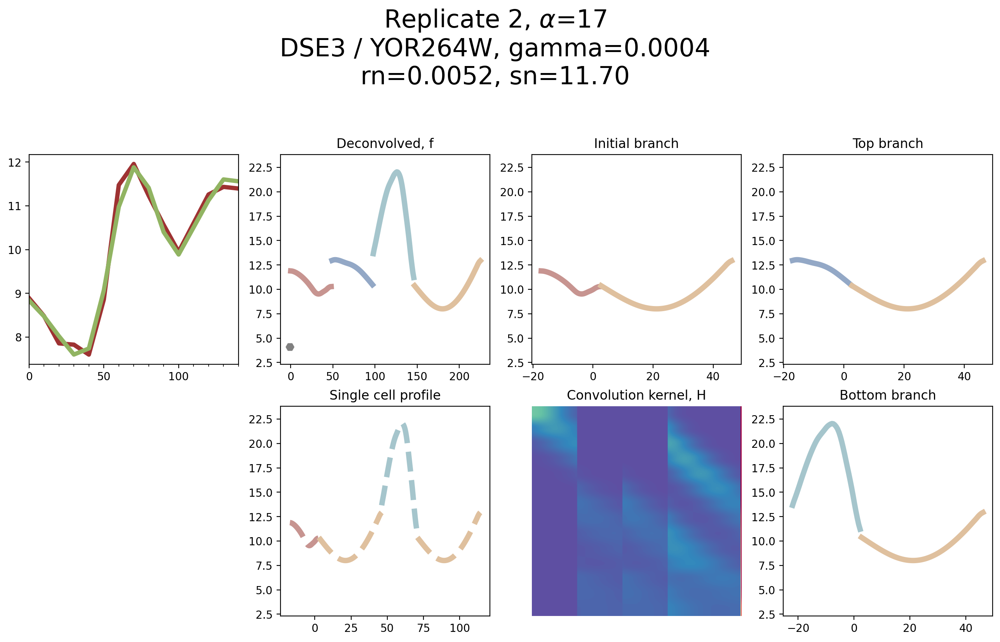

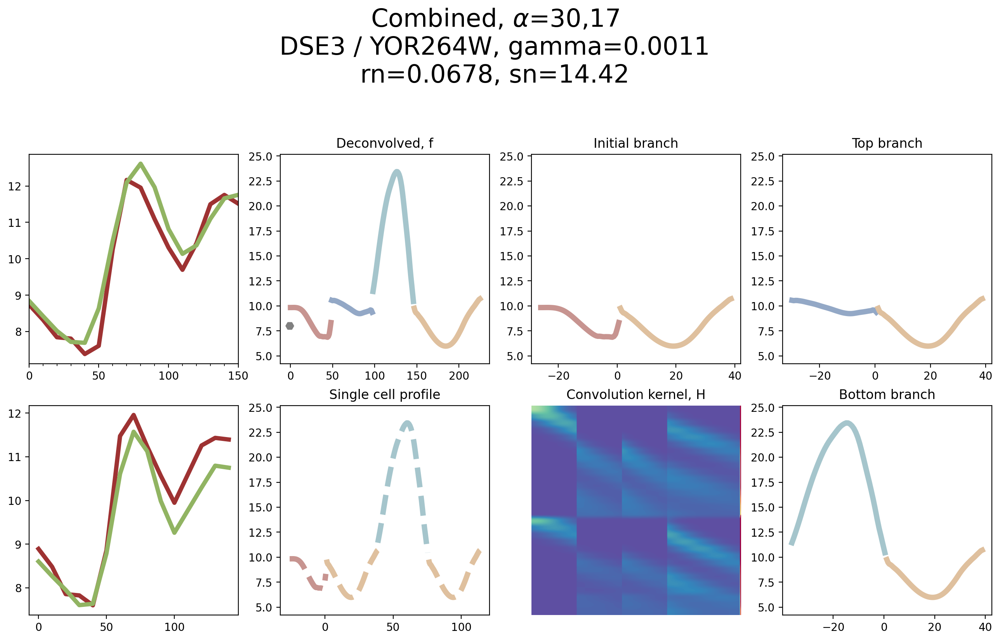

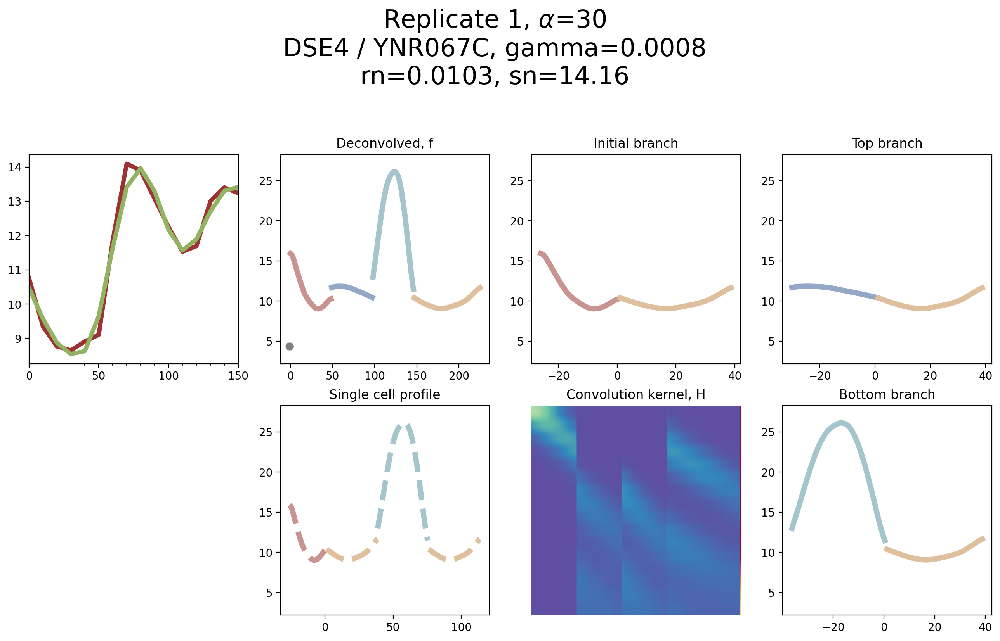

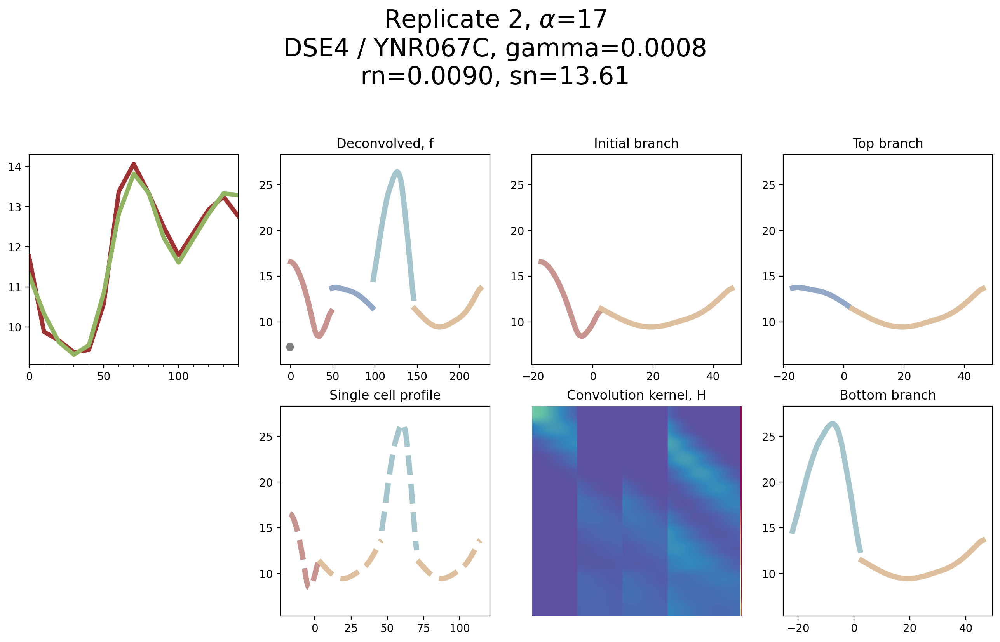

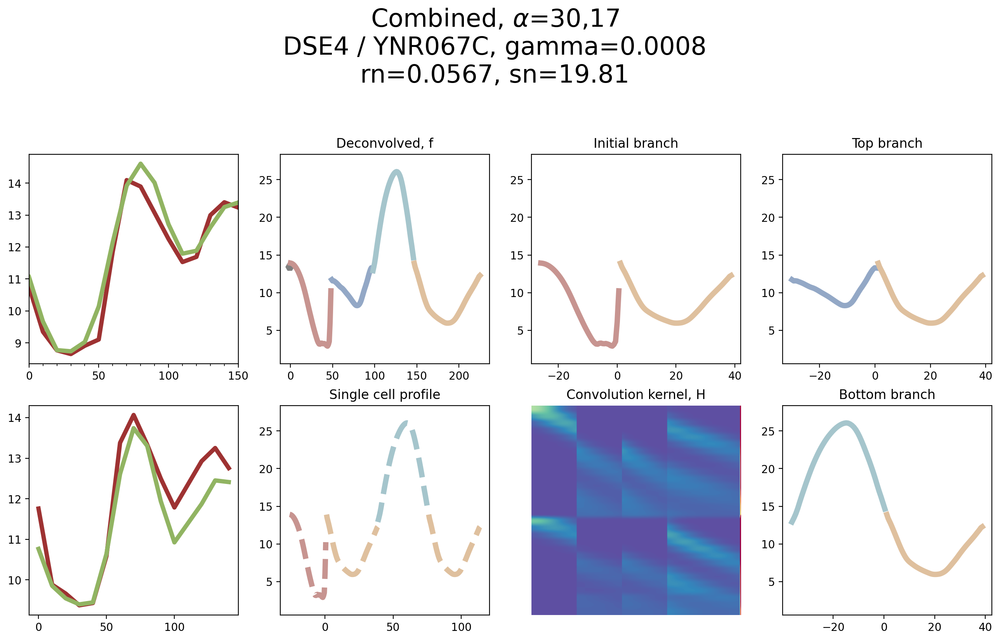

In [44]:
from cc_src.geneset import positive_control_genes

save_dir = 'output/positive_controls/'
save_dir1 = 'output/positive_controls/replicate1'
save_dir2 = 'output/positive_controls/replicate2'

for gene_name in positive_control_genes():

    print(f"Deconvolving gene: {gene_name}")

    save_path1 = f"{save_dir1}/{gene_name}_rep1.png"
    save_path2 = f"{save_dir2}/{gene_name}_rep2.png"
    save_path_combined = f"{save_dir}/{gene_name}_combined.png"
    
    model1 = Model(config1, gene_name, 0)
    model1.deconvolve_find_optimal_gamma()
    fig = model1.plot_deconvolved_gene()
    plt.savefig(save_path1, dpi=150)
    plt.close(fig)
    
    model2 = Model(config2, gene_name, 0)
    model2.deconvolve_find_optimal_gamma()
    fig = model2.plot_deconvolved_gene()
    plt.savefig(save_path2, dpi=150)
    plt.close(fig)    
    
    model_combined = Model(config_combined, gene_name, 0)
    model_combined.deconvolve_find_optimal_gamma()
    fig = model_combined.plot_deconvolved_gene()
    plt.savefig(save_path_combined, dpi=150)
    plt.close(fig)